## Library Imports

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import math
import os
from statistics import mean,median,stdev
from scipy import stats

## Data Loading

In [2]:
#Does some minor pre processing on the read in .txt files to make it easier to parse later
#stores all files into pandas df in list
#phones list is used to analyze phones and syllables
##PHONES##
phones = []

os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/text/phones')
for filename in os.listdir(os.getcwd()):
    if filename.endswith(".txt"):
        current_frame = pd.read_csv(filename, header=None, skiprows=9,sep='\s+',error_bad_lines=False,usecols=[0, 2])
        current_frame[2] = current_frame[2].astype(str)
        current_frame[2] = current_frame[2].map(lambda x: x.lstrip('{').rstrip('};'))
        current_frame[1] = ""
        for i in range(len(current_frame)):
            if current_frame.loc[i,2].islower():
                current_frame.loc[i,1] = 'phone'
            else:
                current_frame.loc[i,1] = 'nsl'
            #elif current_frame.loc[i,2].isupper():
            #    current_frame.loc[i,1] = 'nsl'
        
        phones.append(current_frame)

In [3]:
#Does some minor pre processing on the read in .txt files to make it easier to parse later
#stores all files into pandas df in list
#words list is used to analyze words and breath groups
##WORDS##

words = []


os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/text/words')
for filename in os.listdir(os.getcwd()):
    #print(filename)
    if filename.endswith(".txt"):
        current_frame = pd.read_csv(filename, header=None, skiprows=9,sep='\s+',error_bad_lines=False,usecols=[0, 2])
        current_frame[2] = current_frame[2].map(lambda x: x.lstrip('<{').rstrip('>};'))
        current_frame[1] = ""
        for i in range(len(current_frame)):
            if current_frame.loc[i,2].islower():
                current_frame.loc[i,1] = 'word'
            else:
                current_frame.loc[i,1] = 'nsl'
        words.append(current_frame)

## Data Organization 

In [4]:
##UNION files belonging into a one participant df
##PHONES##
os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/text/phones')

files = [item[0:3] for item in os.listdir(os.getcwd())]
indexes = [i for i in range(len(files)-1) if files[i] != files[i+1] ]
indexes.insert(0,0)
indexes.append(len(phones))
indexes

phone_parts = []
for i in range(len(indexes)-1):
    #get max time stamp#
    if i == 0:
        part = phones[indexes[i]:indexes[i+1]+1]
    elif i > 0:
        part = phones[indexes[i]+1:indexes[i+1]+1] 
    #print(i)
    for j in range(len(part)-1):
        precol_max = part[j].loc[:,0].max()
        #print(precol_max)
        next_col = part[j+1].loc[:,0] 
        
        part[j+1].loc[:,0] = next_col + precol_max
        
    phone_parts.append(pd.concat(part, ignore_index=True))

In [5]:
#Now slice part dfs into four min chunks
##PHONES##
phone_partchunks = []
dt_row = pd.DataFrame({0:0,1:'nsl',2:'NaN'},index=[0])
db_row = phones[0].iloc[-1]

for i in range(len(phone_parts)):
    current = phone_parts[i]
    chunks = []
    for j in range(len(phone_parts[i])):
        max_stamp = current.loc[:,0].max()
        num_chunks = math.floor(max_stamp/240)
        df_length = len(current) - 1
        chunk_length = math.floor(df_length/num_chunks)
    
        if j > 0 and j % chunk_length == 0:
            df = current.loc[j-chunk_length:j]
            df = df.reset_index(drop=True)
            df = pd.concat([dt_row,df], ignore_index=True)
            df = df.append(db_row,ignore_index=True)
            chunks.append(df)
            
    phone_partchunks.append(chunks)

In [6]:
##UNION files belonging into a one participant df
##WORDS##
os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/text/words')

files = [item[0:3] for item in os.listdir(os.getcwd())]
indexes = [i for i in range(len(files)-1) if files[i] != files[i+1] ]
indexes.insert(0,0)
indexes.append(len(words))
indexes

word_parts = []
for i in range(len(indexes)-1):
    #get max time stamp#
    if i == 0:
        part = words[indexes[i]:indexes[i+1]+1]
    elif i > 0:
        part = words[indexes[i]+1:indexes[i+1]+1] 
    #print(i)
    for j in range(len(part)-1):
        precol_max = part[j].loc[:,0].max()
        #print(precol_max)
        next_col = part[j+1].loc[:,0] 
        
        part[j+1].loc[:,0] = next_col + precol_max
        
    word_parts.append(pd.concat(part, ignore_index=True))

In [7]:
#Now slice part dfs into four min chunks
##WORDS##
word_partchunks = []
dt_row = words[0].loc[0]
db_row = words[0].iloc[-1]

for i in range(len(word_parts)):
    current = word_parts[i]
    chunks = []
    for j in range(len(word_parts[i])):
        max_stamp = current.loc[:,0].max()
        num_chunks = math.floor(max_stamp/240)
        df_length = len(current) - 1
        chunk_length = math.floor(df_length/num_chunks)
    
        if j > 0 and j % chunk_length == 0:
            df = current.loc[j-chunk_length:j]
            df = df.reset_index(drop=True)
            df = pd.concat([dt_row,df], ignore_index=True)
            df = df.append(db_row,ignore_index=True)
            chunks.append(df)
            
    word_partchunks.append(chunks)

## Phones

In [8]:
allphone_diffs = []

for k in range(len(phone_partchunks)):
    phone_diffs = []
    for i in range(len(phone_partchunks[k])):
        current_df = phone_partchunks[k][i]
        x = []
        #print(i)
        for j in range(len(current_df)-1):
            if current_df.loc[j,1] == 'phone' and current_df.loc[j+1,1] == 'phone':
                onset = current_df.loc[j,0]
                offset = current_df.loc[j+1,0]
                x.append(offset-onset)
        #threshold = median(x)+(stdev(x)*3)
        #x = [item for item in x if item < threshold]#only keep values less than 3 stdevs away
        phone_diffs.append(x)
    allphone_diffs.append(phone_diffs)

In [9]:
phone_rate = []
for i in range(len(allphone_diffs)):
    for j in range(len(allphone_diffs[i])):
        current = allphone_diffs[i][j]
        rate = len(current)/240
        phone_rate.append(rate)

In [10]:
test = np.concatenate(allphone_diffs)
all_test = []
for i in range(len(test)):
    all_test.append(np.mean(test[i]))
    
print(np.mean(all_test))

0.08185067426625767


(array([860., 346.,  48.,  14.,   7.,   2.,   0.,   0.,   0.,   1.]),
 array([0.01356  , 0.0828561, 0.1521522, 0.2214483, 0.2907444, 0.3600405,
        0.4293366, 0.4986327, 0.5679288, 0.6372249, 0.706521 ]),
 <a list of 10 Patch objects>)

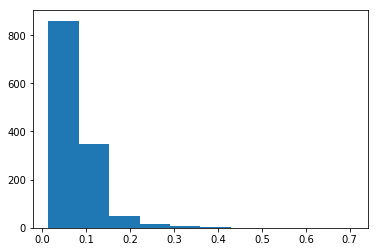

In [11]:
test = allphone_diffs[0][0]
plt.hist(test)

In [12]:

phonepart_cof = []

for k in range(len(allphone_diffs)):
    x = []
    for i in range(len(allphone_diffs[k])):
        part = stats.variation(allphone_diffs[k][i])
        x.append(part)
    phonepart_cof.append(np.asarray(x))
    
phonepart_cof = np.asarray(phonepart_cof)

phonepart_std = []

for k in range(len(allphone_diffs)):
    x = []
    for i in range(len(allphone_diffs[k])):
        part = stdev(allphone_diffs[k][i])
        x.append(part)
    phonepart_std.append(np.asarray(x))
    
phonepart_std = np.asarray(phonepart_std)

In [13]:
#for i in range(len(phonepart_cof)):
#    print(len(phonepart_cof[i]))
    
#len(phone_cof)

In [14]:
len(phonepart_cof)

40

In [15]:
part_means = [np.mean(phonepart_cof[i]) for i in range(len(phonepart_cof))]
part_means

[0.6711031880223136,
 0.7701963665678134,
 0.6771740080577416,
 0.6487552770507518,
 0.6310846114186031,
 0.6858535588572705,
 0.6519823180389083,
 0.6936137833546921,
 0.6267137364378692,
 0.6520723254713006,
 0.622607911448366,
 0.6208294800536778,
 0.6175917957141817,
 0.9199645581016156,
 0.6849823761715444,
 0.6143214704524386,
 0.5757033836751624,
 0.6170943209720469,
 0.6757299524847064,
 0.7160859384302147,
 0.613931688159803,
 0.6378256647906906,
 0.723095879100572,
 0.6741218793200104,
 0.6584659289137508,
 0.6897826327082168,
 0.6914526272547615,
 0.6511963669840992,
 0.7000215278121683,
 0.6625766329468884,
 0.6470882646446802,
 0.6035001201409691,
 0.6488536726824918,
 0.5848351811594036,
 0.5840020137949407,
 0.6743402355461282,
 0.7814674938688237,
 0.6071147741569933,
 0.7119531854923697,
 0.8272095426457285]

## Syllables

In [16]:
#get a list of unique phone labels from all files 

syllables = []

for i in range(len(phones)):
    current_frame = phones[i]
    current_frame = current_frame[current_frame[1] == 'phone']
    current_frame.reset_index(drop=True, inplace=True)
    syllables.append(current_frame)
    
phone_unique = []

for i in range(len(syllables)):
    current_frame = syllables[i]
    phone_unique = phone_unique + current_frame[2].unique().tolist()
    
phone_unique = sorted(list(set(phone_unique)))
#phone_unique 

In [17]:
#create dictionary of unique phone labels and sonority values
#Sonority Levels 1-8
#[Stops,Affricates,Fricatives,Nasals,Liquids,Glides,Syllabified Nasals,Vowels]

ph_dict = {'a':8,'aa':8,'aa+1':8,'aan':7,'ae':8,'ae+1':8,'aen':7,'ah':8,'ah+1':8,'ah+1n':7,'ahn':7,'ao':8,'ao+1':8,'aon':7,'aw':8,'aw+1':8,
           'awn':7,'ay':8,'ay+1':8,'ayn':7,'b':1,'ch':2,'d':1,'dh':1,'dx':1,'eh':8,'eh+1':8,'ehn':7,'el':7,'em':7,'en':7,'eng':7,'er':5,'ern':7,
           'ey':8,'ey+1':8,'eyn':7,'f':3,'g':1,'h':3,'hh':3,'i':8,'id':7,'ih':8,'ih+1':8,'ihn':7,'iy':8,'iy+1':8,'iyn':7,'j':2,'jh':2,'k':1,'l':5,
           'm':4,'n':4,'ng':4,'no':7,'nx':1,'ow':8,'ow+1':8,'own':7,'oy':8,'oy+1':8,'oyn':7,'p':1,'r':5,'s':3,'sh':3,'t':1,'th':3,'tq':1,
           'uh':8,'uh+1':8,'uhn':7,'uw':8,'uw+1':8,'uwn':7,'v':3,'w':6,'y':6,'z':3,'zh':2}

#duplicate phone label list and use map function 
for k in range(len(phone_partchunks)):
    for i in range(len(phone_partchunks[k])):
        current_frame = phone_partchunks[k][i]
        current_frame['sonority'] = current_frame[2]
        current_frame['sonority'] = current_frame['sonority'].map(ph_dict)

In [18]:
##Visualize sonority value examples##
#test = syllables[3]
#s = test.loc[0:50,'sonority']
#s.plot.line()

In [19]:
###Use Sonority Values for Labels###

# iterate accross phone files
for k in range(len(phone_partchunks)):
    for i in range(len(phone_partchunks[k])):
        df = phone_partchunks[k][i]
        df['labels'] = ""
        #print(i)
        #iterate over each data frame
        for j in range(len(df)-1):
            #select only phones that are adjacent to other phones
            if df.loc[j,1] == 'phone' and df.loc[j+1,1] == 'phone':
                #label starts and stop of adjacent phones
                if df.loc[j,1] == 'phone' and df.loc[j-1,1] == 'nsl':
                    df.loc[j,'labels'] = 'start'
                
                if df.loc[j,1] == 'phone' and df.loc[j+2,1] == 'nsl':
                    df.loc[j+1,'labels'] = 'stop'
                ###compare sonority values
                #identfy troughs
                elif df.loc[j,'sonority'] < df.loc[j-1,'sonority'] and df.loc[j,'sonority'] < df.loc[j+1,'sonority']:
                    df.loc[j,'labels'] = 'trough'
                
                #identify valleys
                elif df.loc[j,'sonority'] == df.loc[j+1,'sonority'] and df.loc[j,'sonority'] < df.loc[j-1,'sonority']:
                    df.loc[j,'labels'] = 'vs'
                
                    #capture ve next to slopes 
                    if df.loc[j+1,'sonority'] > df.loc[j+2,'sonority']:##IDs a VE preceding a slope
                        #df.loc[j+1,'labels'] = 've'
                        ##USE VE ID to rewrite VS to Null value
                        df.loc[j,'labels'] = ''
                        ##also try to identify longer valleys of this type
                    elif df.loc[j+2,'sonority'] == df.loc[j+1,'sonority'] and df.loc[j+2,'sonority'] > df.loc[j+3,'sonority']:
                        df.loc[j,'labels'] = '' 
                    
                    
                if df.loc[j,'sonority'] == df.loc[j-1,'sonority'] and df.loc[j,'sonority'] < df.loc[j+1,'sonority']:
                    df.loc[j,'labels'] = 've'
                
                    #capture vs on flat peaks
                    if df.loc[j-1,'sonority'] > df.loc[j-2,'sonority']:#IDS a VS proceeding a climb
                        #df.loc[j-1,'labels'] = 'vs'
                        ##USE VS ID to rewrite VS to null value
                        df.loc[j,'labels'] = ''
                        ##also try to identify longer valleys of this type
                    elif df.loc[j-2,'sonority'] == df.loc[j-1,'sonority'] and df.loc[j-2,'sonority'] > df.loc[j-3,'sonority']:
                        df.loc[j,'labels'] = ''
                        
                    elif df.loc[j-1,'labels'] == 'start':
                        df.loc[j,'labels'] = ''
                    
                
                
            #how to deal with possible START valleys or STOP valleys
            

In [20]:
##Use Labels to do onset/offset diffs##

#define syllables list of DFs containing identified labels only
syllables = []
label_types = ['start','stop','trough','vs','ve']

allsyll_diffs = []
onset_labels = ['start','ve']
offset_labels = ['stop','vs']

for k in range(len(phone_partchunks)):
    x = []
    for i in range(len(phone_partchunks[k])):
        df = phone_partchunks[k][i]
        df = df[df['labels'].isin(label_types)]
        df.reset_index(drop=True, inplace=True)
        x.append(df)
    syllables.append(x)
    

for k in range(len(syllables)):
    syll_diffs = []
    for i in range(len(syllables[k])):
        df = syllables[k][i]
        x = []
    
        for j in range(len(df)):
            if df.loc[j,'labels'] in onset_labels:
                onset = df.loc[j,0]
            
                #print(df.loc[j,2])
            
            elif df.loc[j,'labels'] == 'stop':
                offset = df.loc[j,0]
                x.append(offset-onset)
            
            elif df.loc[j,'labels'] == 'vs':
                offset = df.loc[j+1,0]
                x.append(offset-onset)
                #print(df.loc[j,2])
                #print('-----')
            
            elif df.loc[j,'labels'] == 'trough':
                offset = df.loc[j+1,0]
                x.append(offset-onset)
                #print(df.loc[j,2])
                #print('-----')
                onset = df.loc[j+1,0]
            
                #need to capture CVC, CV might be either missing or over lapping 
                #all stops will use its onset so clipping off to a CV
                #when valley start is identified use next phone as offset index, same as cvc
                #leave s valley
                #what to do when there's two valleys next to each other?
            
        syll_diffs.append(x)
    allsyll_diffs.append(syll_diffs)

allsyll_diffs

[[[0.24545200000000023,
   0.1263669999999948,
   0.06780399999999531,
   0.324105000000003,
   0.22475299999999976,
   0.19427799999999706,
   0.19459800000000627,
   0.39394399999999763,
   0.19866700000000037,
   0.13058199999999687,
   0.26222000000000634,
   0.2850219999999979,
   0.19278400000000318,
   0.563453999999993,
   0.0,
   0.2963059999999942,
   0.13560800000000484,
   0.27257399999999876,
   0.06577000000000055,
   0.022376000000001284,
   0.24341700000000088,
   0.0711949999999959,
   0.5972650000000002,
   0.3011720000000011,
   0.0,
   0.11190200000000772,
   0.3641890000000032,
   0.7181319999999971,
   0.0,
   0.2569780000000037,
   0.09424800000000033,
   0.15662900000000235,
   0.08611099999999539,
   0.13029399999999214,
   0.0832900000000052,
   0.312578000000002,
   0.1613749999999996,
   0.3440219999999954,
   0.19027600000000433,
   0.18713999999999942,
   0.438016999999995,
   0.0,
   0.15144599999999286,
   0.25517099999999004,
   0.22000000000000597,
   

In [21]:
##SPEAKING RATE##
#sylls/time(secs)
#based on the syllables we captured

syll_rate = []
for i in range(len(allsyll_diffs)):
    for j in range(len(allsyll_diffs[i])):
        current = allsyll_diffs[i][j]
        rate = len(current)/240
        syll_rate.append(rate)
        
#data to dict
#d = {'word_rate':word_rate}
#new_data = pd.DataFrame.from_dict(d)
#new_data.to_csv('noun_data.csv')

In [22]:
test = np.concatenate(allsyll_diffs)
all_test = []
for i in range(len(test)):
    all_test.append(np.mean(test[i]))
    
print(np.mean(all_test))

0.20430706229084275


(array([127., 167., 104.,  57.,  23.,  11.,   7.,   1.,   2.,   1.]),
 array([0.       , 0.0958281, 0.1916562, 0.2874843, 0.3833124, 0.4791405,
        0.5749686, 0.6707967, 0.7666248, 0.8624529, 0.958281 ]),
 <a list of 10 Patch objects>)

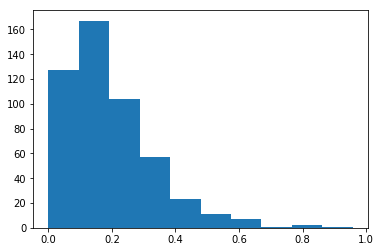

In [23]:
plt.hist(allsyll_diffs[0][0])

In [24]:
syll_cof = []

for k in range(len(allsyll_diffs)):
    x = []
    for i in range(len(allsyll_diffs[k])):
        part = stats.variation(allsyll_diffs[k][i])
        x.append(part)
        
    syll_cof.append(np.asarray(x))
    
syll_cof = np.asarray(syll_cof)

syll_std = []

for k in range(len(allsyll_diffs)):
    x = []
    for i in range(len(allsyll_diffs[k])):
        part = stdev(allsyll_diffs[k][i])
        x.append(part)
        
    syll_std.append(np.asarray(x))
    
syll_std = np.asarray(syll_std)


In [25]:
part_means = [np.mean(syll_cof[i]) for i in range(len(syll_cof))]
part_means

[0.7312311279865671,
 0.7834307725476378,
 0.7384677829330211,
 0.7342601740301432,
 0.726876087095258,
 0.7368697995346041,
 0.7002762660084249,
 0.7302524741942604,
 0.6991793850942203,
 0.7098759222390935,
 0.7269735912880505,
 0.684291387644866,
 0.7312982635416015,
 0.8411878441723903,
 0.7382866488335108,
 0.7157501188867624,
 0.6886564011046941,
 0.7215004179923646,
 0.7668024421718191,
 0.764245218773377,
 0.7500469749817459,
 0.7362545179854683,
 0.7772294391751433,
 0.7314635736483271,
 0.7311982993126579,
 0.746070920178415,
 0.7481053383743007,
 0.7209685895598745,
 0.7429917355602023,
 0.739301269268045,
 0.7503754223522778,
 0.7105936905391979,
 0.7456180371020481,
 0.6959144219085135,
 0.6768755002655679,
 0.7382375121785317,
 0.7854954124109356,
 0.6779002283374577,
 0.7786962542538294,
 0.8209074720186093]

In [52]:
test = phone_partchunks[0][2]
test[540:590]
#count = test['labels'].value_counts()
#count
#CHECK#
#loop phones list and look at labels value counts
#if count['vs']/count['ve'] == 1 then print i

,0,1,2,sonority,labels
540,624.726744,phone,uw,8.0,
541,624.808408,phone,z,3.0,stop
542,625.044114,nsl,VOCNOISE,NaN,
543,625.093298,phone,r,5.0,start
544,625.167538,phone,ih,8.0,
545,625.311231,phone,p,1.0,trough
546,625.430149,phone,ao,8.0,
547,625.489541,phone,r,5.0,
548,625.555429,phone,t,1.0,trough
549,625.748452,phone,s,3.0,


In [27]:
#test.loc[330:380]


In [28]:
#syllables[1][2].loc[150:200]

## Words

In [29]:
allword_diffs = []

for k in range(len(word_partchunks)):
    word_diffs = []
    for i in range(len(word_partchunks[k])):
        current_df = word_partchunks[k][i]
        x = []
        for j in range(len(current_df)):
            if current_df.loc[j,1] == 'word' and current_df.loc[j+1,1] == 'word':
                onset = current_df.loc[j,0]
                offset = current_df.loc[j+1,0]
                x.append(offset-onset)
            
        #threshold = median(x)+(stdev(x)*3)
        #x = [item for item in x if item < threshold]        
        word_diffs.append(x)
    allword_diffs.append(word_diffs)

In [30]:
##SPEAKING RATE##
#word/time(secs)

word_rate = []
for i in range(len(allword_diffs)):
    for j in range(len(allword_diffs[i])):
        current = allword_diffs[i][j]
        rate = len(current)/240
        word_rate.append(rate)

In [31]:
test = np.concatenate(allword_diffs)
all_test = []
for i in range(len(test)):
    all_test.append(np.mean(test[i]))
    
print(np.mean(all_test))

0.24314294102377804


(array([69., 90., 68., 47., 24., 21., 11.,  8., 10.,  4.]),
 array([0.030512, 0.108826, 0.18714 , 0.265454, 0.343768, 0.422082,
        0.500396, 0.57871 , 0.657024, 0.735338, 0.813652]),
 <a list of 10 Patch objects>)

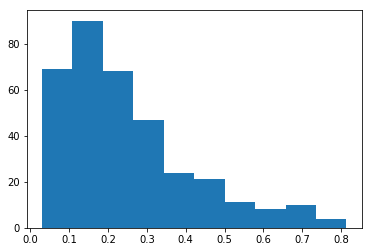

In [32]:
test = allword_diffs[0][0]
plt.hist(test)

In [33]:
word_cof = []

for k in range(len(allword_diffs)):
    x = []
    for i in range(len(allword_diffs[k])):
        part = stats.variation(allword_diffs[k][i])
        x.append(part)
    word_cof.append(np.asarray(x))
    
word_cof = np.asarray(word_cof)

word_std = []

for k in range(len(allword_diffs)):
    x = []
    for i in range(len(allword_diffs[k])):
        part = stdev(allword_diffs[k][i])
        x.append(part)
    word_std.append(np.asarray(x))
    
word_std = np.asarray(word_std)


In [34]:
part_means = [np.mean(word_cof[i]) for i in range(len(word_cof))]
part_means

[0.637768166006817,
 0.7084895600810902,
 0.6391228667575193,
 0.5870799390359961,
 0.8918891573875775,
 0.6688475708811813,
 0.6043972092823638,
 0.6542625701493683,
 0.5888569194750516,
 0.6135403014889681,
 0.5860200152135817,
 0.5758994729697237,
 0.6287942732771926,
 0.677211091624437,
 0.6623158668741317,
 0.6453667732554573,
 0.5998527267865443,
 0.6032972659313612,
 0.8116629072278168,
 0.6536051375484146,
 0.5929894126888043,
 0.5855860129271829,
 0.647894506385492,
 0.591824068790865,
 0.6043092123262095,
 0.6643806218913,
 0.6894503793427346,
 0.6081141794462308,
 0.68363131500885,
 0.6432659429386289,
 0.5885284515576542,
 0.6024472339267015,
 0.6471745644298971,
 0.6545683010262531,
 0.6401808178186296,
 0.5919871871943813,
 0.6814157136349496,
 0.5722620886295999,
 0.6340214819992737,
 0.696100675032129]

## N-Words

In [62]:
nword_diffs = []

for k in range(len(word_partchunks)):
    word_diffs = []
    for i in range(len(word_partchunks[k])):
        current_df = word_partchunks[k][i]
        x = []
        counter = 0
        for j in range(len(current_df)-3):
            if current_df.loc[j,1] == 'word' and current_df.loc[j+1,1] == 'word':
                if counter % 3 == 0 or counter == 0:
                    onset = current_df.loc[j,0]
                    if current_df.loc[j+3,1] == 'word':
                        offset = current_df.loc[j+3,0]
                        x.append(offset-onset)
                    
                counter = counter + 1
            else:
                counter = 0
            
               
        word_diffs.append(x)
    nword_diffs.append(word_diffs)

In [65]:
nword_diffs

[[[0.7811060000000012,
   0.9757050000000049,
   0.6149860000000018,
   0.3315630000000027,
   0.9696319999999972,
   0.9915219999999962,
   0.3797040000000038,
   0.538152999999987,
   0.7971140000000005,
   0.3771859999999947,
   1.5091309999999893,
   1.0841919999999874,
   1.0896160000000066,
   0.3670110000000051,
   0.8833020000000005,
   0.6048150000000021,
   0.6888929999999931,
   0.8227579999999932,
   0.717242000000013,
   0.5940949999999958,
   1.05368,
   0.9140030000000081,
   0.8068719999999843,
   0.9248520000000013,
   0.5180249999999944,
   1.3533749999999998,
   0.3546180000000021,
   0.8617930000000058,
   0.42309899999999345,
   0.4407290000000046,
   0.5776929999999965,
   0.9512950000000018,
   0.7438140000000004,
   0.6136290000000031,
   1.05368,
   0.4895479999999992,
   0.7302529999999905,
   0.46852900000000375,
   0.9953679999999991,
   1.118772000000007,
   0.4018090000000001,
   0.7157979999999924,
   0.6780430000000024,
   0.3993679999999955,
   0.613214

In [73]:
test = np.concatenate(nword_diffs)
all_test = []
for i in range(len(test)):
    all_test.append(np.mean(test[i]))
    
print(np.mean(all_test))

0.8073941853768378


(array([65., 36.,  9.,  4.,  0.,  0.,  0.,  1.,  1.,  2.]),
 array([0.268806 , 0.7008933, 1.1329806, 1.5650679, 1.9971552, 2.4292425,
        2.8613298, 3.2934171, 3.7255044, 4.1575917, 4.589679 ]),
 <a list of 10 Patch objects>)

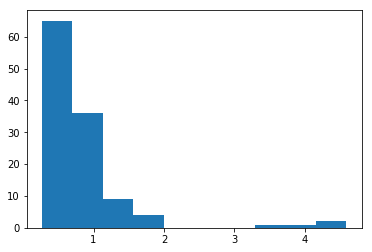

In [64]:
test = nword_diffs[0][0]
plt.hist(test)

In [66]:
nword_cof = []

for k in range(len(nword_diffs)):
    x = []
    for i in range(len(nword_diffs[k])):
        part = stats.variation(nword_diffs[k][i])
        x.append(part)
    nword_cof.append(np.asarray(x))
    
nword_cof = np.asarray(nword_cof)
nword_cof

array([array([0.80442516, 3.24153188, 0.63499651, 0.8715132 , 1.92369187,
       0.42602702, 0.41393669, 1.32931414, 0.53947643, 0.79385037,
       0.97191461]),
       array([0.40637819, 0.65311115, 0.47775373, 0.62002727, 0.53188404,
       0.42303945, 0.58805144, 3.98059831, 0.55458426, 2.866246  ,
       0.42731126, 0.44362193, 1.84294093, 3.83717029, 0.33232112,
       0.34096234, 2.48642657, 0.4049544 ]),
       array([0.4033337 , 0.37298243, 0.41783039, 0.35624506, 0.39926938,
       0.48517866, 0.39837879, 0.4183558 , 0.42038564, 0.36991032,
       0.42404735, 0.40458607, 0.36957293, 0.40863438, 0.34314093,
       0.37129417, 0.42319156, 0.43889923]),
       array([0.95769974, 0.64878531, 0.47557542, 0.33701182, 0.57519047,
       0.94016005, 1.54926487, 2.43036997, 0.45411492, 2.595462  ,
       0.41278991, 1.28545387, 0.55369   , 0.50563738, 0.46340481]),
       array([0.35995888, 0.45280027, 1.23301241, 1.34152824, 0.37450343,
       0.41043157, 0.45766485, 0.86617753, 1.524

In [69]:
nword_cof = np.concatenate(nword_cof)
col_dict = {'3word_cof':nword_cof}

col_data = pd.DataFrame.from_dict(col_dict)

In [71]:
col_data.to_csv('3word_data.csv')

In [67]:
part_means = [np.mean(nword_cof[i]) for i in range(len(nword_cof))]
part_means

[1.0864252622851054,
 1.1787434815214077,
 0.4014020430143936,
 0.9456407036914135,
 1.0641106794764101,
 1.13231285763205,
 0.7477916846515341,
 0.6874731003059422,
 1.0640803519586997,
 0.5172045907467258,
 0.4637860419695141,
 0.6613647666836603,
 0.4505435247222778,
 0.6541158723033405,
 0.5900988998485391,
 0.5438433782333774,
 0.45336286400703923,
 0.6604941010844627,
 0.7846697895914779,
 1.3973224205330552,
 0.6100064638274266,
 0.6876450792073154,
 0.5007457201495196,
 0.8299170797861661,
 0.5706065884045042,
 0.7443937751013963,
 0.6855678070831649,
 0.6595108992629607,
 1.1378646974939104,
 0.7553102969795856,
 0.5156301770917853,
 0.5488598765702893,
 0.659312687081423,
 0.9515946984199852,
 0.5674407577493686,
 0.9831195969210219,
 1.3476926456322609,
 0.567396131837662,
 0.7115408958032629,
 0.9788559621580418]

## Breath Groups

In [35]:
for k in range(len(word_partchunks)):
    for i in range(len(word_partchunks[k])):
        current_frame = word_partchunks[k][i]
        current_frame['bgs'] = ""
        #print(i)
        for j in range(len(current_frame)):
            if current_frame.loc[j,1] == 'word' and current_frame.loc[j+1,1] == 'word':
                current_frame.loc[j,'bgs'] = 'in'
            else:
                current_frame.loc[j,'bgs'] = 'out'

In [36]:
allbg_diffs = []

for k in range(len(word_partchunks)):
    bg_diffs = []
    for i in range(len(word_partchunks[k])):
        current_df = word_partchunks[k][i]
        x = []
        for j in range(len(current_df)):
            #print(i)
            if current_df.loc[j,'bgs'] == 'in' and current_df.loc[j-1,'bgs'] == 'out':
                onset = current_df.loc[j,0]
            
            elif current_df.loc[j,'bgs'] == 'in' and current_df.loc[j+1,'bgs'] == 'out':
                offset = current_df.loc[j,0]
            
                x.append(offset-onset)
            
        #threshold = median(x)+(stdev(x)*3)
        #x = [item for item in x if item < threshold]        
        bg_diffs.append(x)
    allbg_diffs.append(bg_diffs)
    

In [37]:
bg_rate = []
for i in range(len(allbg_diffs)):
    for j in range(len(allbg_diffs[i])):
        current = allbg_diffs[i][j]
        rate = len(current)/240
        bg_rate.append(rate)
        


In [38]:
test = np.concatenate(allbg_diffs)
all_test = []
for i in range(len(test)):
    all_test.append(np.mean(test[i]))
    
print(np.mean(all_test))

1.314500616833471


(array([ 8.,  7., 12.,  2.,  4.,  1.,  1.,  1.,  2.,  3.]),
 array([0.064414 , 0.5526734, 1.0409328, 1.5291922, 2.0174516, 2.505711 ,
        2.9939704, 3.4822298, 3.9704892, 4.4587486, 4.947008 ]),
 <a list of 10 Patch objects>)

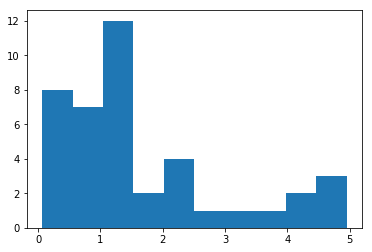

In [39]:
test = allbg_diffs[0][0]
plt.hist(test)

In [40]:
allbreath_cof = []

for k in range(len(allbg_diffs)):
    breath_cof = []
    for i in range(len(allbg_diffs[k])):
        x = stats.variation(allbg_diffs[k][i])
        breath_cof.append(x)
    allbreath_cof.append(np.asarray(breath_cof))
    
allbreath_cof = np.asarray(allbreath_cof)

allbreath_std = []

for k in range(len(allbg_diffs)):
    breath_std = []
    for i in range(len(allbg_diffs[k])):
        x = stdev(allbg_diffs[k][i])
        breath_std.append(x)
    allbreath_std.append(np.asarray(breath_std))
    
allbreath_std = np.asarray(allbreath_std)


In [41]:
part_means = [np.mean(allbreath_cof[i]) for i in range(len(allbreath_cof))]
part_means

[0.8400881660950261,
 0.852134652197537,
 0.8160662879171441,
 0.7990447944562887,
 0.8892210279685793,
 0.7163288423747165,
 0.8417623661889263,
 0.7932919571543083,
 0.7895058978869286,
 0.8932376137943341,
 0.8099034619496122,
 0.8636317444072363,
 0.842921515495571,
 0.8360877730456354,
 0.8528965623360931,
 0.7792101682436519,
 0.8374204863487231,
 0.7938734409540679,
 0.8488175939139689,
 0.7813447477839229,
 0.8195529455759468,
 0.7421559095766804,
 0.8121868385252434,
 0.7760493197775009,
 0.7603272806417669,
 0.8532194971974213,
 0.8388301884767749,
 0.9134768601512875,
 0.7607687833683621,
 0.7970169135736458,
 0.785873002110541,
 0.8619865931240616,
 0.8502459163529795,
 0.8293783801057548,
 0.8293489821742838,
 0.8235525262870423,
 0.9074687938052926,
 0.8264561929328548,
 0.826641316169575,
 0.834382811714245]

## Nouns and Lexical Words

In [35]:
#get parts of speech column and concat to have pos and timestamp info for lexical word filtering 
pos_all = []
pos_time = []

os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/text/words')
for filename in os.listdir(os.getcwd()):
    #print(filename)
    if filename.endswith(".txt"):
        
        df = pd.read_csv(filename, header=None, skiprows=9,sep=';',error_bad_lines=False)
        df[3] = df[3].astype(str)
        df = df[3].map(lambda x: x.strip())
        #df[3] = df[3].astype(object)
        df1 = pd.read_csv(filename, header=None, skiprows=9,sep='\s+',error_bad_lines=False,usecols=[0])
        pos_all.append(df)
        pos_time.append(df1)
        
pos = []

for i in range(len(pos_all)):
    df1 = pos_time[i]
    df2 = pos_all[i]
    df = pd.concat([df1,df2],axis=1)
    pos.append(df)
    
        

        

In [36]:
pos[0]

,0,3
0,0.102385,null
1,4.275744,null
2,8.513518,null
3,32.216575,null
4,32.622045,NN
5,37.129002,null
6,38.123014,null
7,44.617996,null
8,44.946848,UH
9,45.355708,null


In [37]:

files = [item[0:3] for item in os.listdir(os.getcwd())]
indexes = [i for i in range(len(files)-1) if files[i] != files[i+1] ]
indexes.insert(0,0)
indexes.append(len(pos))
indexes

pos_parts = []
for i in range(len(indexes)-1):
    #get max time stamp#
    if i == 0:
        part = pos[indexes[i]:indexes[i+1]+1]
    elif i > 0:
        part = pos[indexes[i]+1:indexes[i+1]+1] 
    #print(i)
    for j in range(len(part)-1):
        precol_max = part[j].loc[:,0].max()
        #print(precol_max)
        next_col = part[j+1].loc[:,0] 
        
        part[j+1].loc[:,0] = next_col + precol_max
        
    pos_parts.append(pd.concat(part, ignore_index=True))
    
pos_partchunks = []
dt_row = pos[0].loc[0]
db_row = pos[0].iloc[-1]

for i in range(len(pos_parts)):
    current = pos_parts[i]
    chunks = []
    for j in range(len(pos_parts[i])):
        max_stamp = current.loc[:,0].max()
        num_chunks = math.floor(max_stamp/240)
        df_length = len(current) - 1
        chunk_length = math.floor(df_length/num_chunks)
    
        if j > 0 and j % chunk_length == 0:
            df = current.loc[j-chunk_length:j]
            df = df.reset_index(drop=True)
            df = pd.concat([dt_row,df], ignore_index=True)
            df = df.append(db_row,ignore_index=True)
            chunks.append(df)
            
    pos_partchunks.append(chunks)

In [38]:
noun_list = ['NN','NNS','NNP','NNPS']

noun_diffs = []

for i in range(len(pos_partchunks)):
    for j in range(len(pos_partchunks[i])):
        chunk = []
        df = pos_partchunks[i][j]
        for k in range(len(df)):
            if df.loc[k,3] in noun_list and df.loc[k+1,3] != 'null':
                onset = df.loc[k,0]
                offset = df.loc[k+1,0]
                diff = offset-onset
                chunk.append(diff)
        noun_diffs.append(chunk)


In [39]:
noun_cof = []

for i in range(len(noun_diffs)):
    cof = stats.variation(noun_diffs[i])
    noun_cof.append(cof)
    
    
noun_cof = np.asarray(noun_cof)

In [40]:
len(noun_diffs)

543

In [42]:
noun_rate = []
for i in range(len(noun_diffs)):
    current = noun_diffs[i]
    rate = len(current)/240
    noun_rate.append(rate)

In [136]:
#data to csv
d = {'noun_cof':noun_cof}
new_data = pd.DataFrame.from_dict(d)
new_data.to_csv('noun_data.csv')

In [43]:
#lexical words
lex_list = ['NN','NNS','NNP','NNPS','JJ','JJR','JJS','RB','RBR','RBS','VB','VBD','VBG','VBN','VBP','VBZ','WRB']

lex_diffs = []

for i in range(len(pos_partchunks)):
    for j in range(len(pos_partchunks[i])):
        chunk = []
        df = pos_partchunks[i][j]
        for k in range(len(df)):
            if df.loc[k,3] in lex_list and df.loc[k+1,3] != 'null':
                onset = df.loc[k,0]
                offset = df.loc[k+1,0]
                diff = offset-onset
                chunk.append(diff)
        lex_diffs.append(chunk)
        
lex_cof = []

for i in range(len(lex_diffs)):
    cof = stats.variation(lex_diffs[i])
    lex_cof.append(cof)
    
    
lex_cof = np.asarray(lex_cof)

In [44]:
lex_rate = []
for i in range(len(lex_diffs)):
    current = lex_diffs[i]
    rate = len(current)/240
    lex_rate.append(rate)

In [138]:
#data to csv
d = {'lex_cof':lex_cof}
new_data = pd.DataFrame.from_dict(d)
new_data.to_csv('lex_data.csv')

In [45]:
#function words
func_list = ['DT','EX','IN','PDT','PRP','PP$','TO','WDT','WP','WP$']

func_diffs = []

for i in range(len(pos_partchunks)):
    for j in range(len(pos_partchunks[i])):
        chunk = []
        df = pos_partchunks[i][j]
        for k in range(len(df)):
            if df.loc[k,3] in func_list and df.loc[k+1,3] != 'null':
                onset = df.loc[k,0]
                offset = df.loc[k+1,0]
                diff = offset-onset
                chunk.append(diff)
        func_diffs.append(chunk)
        
func_cof = []

for i in range(len(func_diffs)):
    cof = stats.variation(func_diffs[i])
    func_cof.append(cof)
    
    
func_cof = np.asarray(func_cof)

In [46]:
func_rate = []
for i in range(len(func_diffs)):
    current = func_diffs[i]
    rate = len(current)/240
    func_rate.append(rate)

In [ ]:
d = {'phone_rate':phone_rate,'word_rate':word_rate,'bg_rate':bg_rate}

new_data = pd.DataFrame.from_dict(d)
new_data.to_csv('rates_data.csv')

In [55]:
#data to csv
d = {'phone_rate':phone_rate,'syllable_rate':syll_rate,'word_rate':word_rate,'bg_rate':bg_rate,'function_rate':func_rate,'lexical_rate':lex_rate,'noun_rate':noun_rate}
rate_data = pd.DataFrame.from_dict(d)
rate_data.to_csv('allrate_data.csv')

## Data to Pandas Frame

In [50]:
import scipy.io as sio
import h5py
from scipy.io import loadmat


##Load in mat file data into dict
os.chdir('/Users/cogmech/Documents/Buckeye_AF/Data/audio')



In [51]:
f = h5py.File('audio_af.mat', 'r')
list(f.keys())

['lax', 'lays', 'lin', 'm', 'quad']

In [42]:
f['quad'][0]

array([-0.03394953, -0.04526561, -0.03152641, -0.05350912, -0.02680755,
       -0.06373003, -0.09186062, -0.04258081, -0.04686284, -0.07523047,
       -0.07218646, -0.02441564,  0.03925105, -0.03622073, -0.04030808,
       -0.03950372, -0.04553768, -0.05026307, -0.10651117, -0.01185874,
       -0.03382856, -0.02484485, -0.01332506, -0.0649066 , -0.04631619,
       -0.05552159, -0.05304679, -0.03513279, -0.05508466, -0.04795755,
       -0.07549126, -0.03429449, -0.04708066, -0.08124334, -0.07672382,
       -0.06402004, -0.10031178, -0.07478914, -0.05243615, -0.07244446,
       -0.09291502, -0.06301815, -0.06603729, -0.07287127, -0.08497408,
       -0.01662207, -0.00923595, -0.09109184, -0.08344599, -0.05982048,
       -0.09465618, -0.10605242, -0.10443118, -0.06768187, -0.05364282,
       -0.08421326, -0.05803925, -0.08648355, -0.08208113, -0.06918852,
       -0.08675632, -0.0537513 , -0.07540433, -0.06477095, -0.05486646,
       -0.04204648, -0.05269738, -0.06919057, -0.03405219, -0.03

In [34]:
phonepart_cof = np.concatenate(phonepart_cof)
syll_cof = np.concatenate(syll_cof)
word_cof = np.concatenate(word_cof)
allbreath_cof = np.concatenate(allbreath_cof)

In [35]:
len(phonepart_cof)

543

In [57]:
##STDEV data##
phonepart_std = np.concatenate(phonepart_std)
syll_std = np.concatenate(syll_std)
word_std = np.concatenate(word_std)
allbreath_std = np.concatenate(allbreath_std)

stdev_data = {'phone_std':phonepart_std,'syll_std':syll_std,'word_std':word_std,'bg_std':allbreath_std,'s_rate':all_rates}
allstd_data = pd.DataFrame.from_dict(stdev_data)
allstd_data.to_csv('stdev_data.csv')

In [43]:
data_dict = {'phone_cof':phonepart_cof,'syll_cof':syll_cof,'word_cof':word_cof,'bg_cof':allbreath_cof,
             'lin_slope':f['lin'][0],'quad_coef':f['quad'][0],'quad_slope':f['quad'][1],
             'ay1':f['lays'][0],'ay2':f['lays'][1],'ay3':f['lays'][2],'ay4':f['lays'][3],
             'ay5':f['lays'][4],'ay6':f['lays'][5],'ay7':f['lays'][6],'ay8':f['lays'][7],
             'ay9':f['lays'][8],'ay10':f['lays'][9],'ay11':f['lays'][10]}

In [44]:

all_data = pd.DataFrame.from_dict(data_dict)
all_data

,phone_cof,syll_cof,word_cof,bg_cof,lin_slope,quad_coef,quad_slope,ay1,ay2,ay3,ay4,ay5,ay6,ay7,ay8,ay9,ay10,ay11
0,0.673165,0.737770,0.674094,0.818625,0.811528,-0.033950,0.760081,-0.777389,0.150790,1.153248,1.815331,2.272281,2.654624,2.905942,3.612207,4.165777,4.697614,5.307329
1,0.657863,0.767462,0.648226,0.805373,0.870221,-0.045266,0.801627,-1.046267,-0.024089,1.030030,1.714663,2.313819,2.594705,3.023908,3.675602,4.427643,4.938499,5.288908
2,0.645655,0.723578,0.606074,0.717818,0.758391,-0.031526,0.710617,-0.888326,0.072919,1.131356,1.863261,2.289672,2.400115,2.933174,3.078231,3.578272,4.087365,5.382164
3,0.838718,0.826288,0.608276,0.792423,0.745001,-0.053509,0.663915,-0.964728,0.055329,1.064432,1.753515,2.161772,2.623772,2.872751,3.294644,3.621716,3.933945,5.000054
4,0.627423,0.698883,0.621790,0.810731,0.905758,-0.026808,0.865134,-0.997409,-0.058489,0.934836,1.792401,2.283926,2.610769,3.161014,3.543867,4.246274,5.333937,5.637897
5,0.656860,0.763320,0.650223,0.978054,0.798493,-0.063730,0.701919,-0.941808,0.033965,1.008430,1.732060,2.296108,2.801180,3.112993,3.596896,4.183800,4.199501,5.087643
6,0.587497,0.655362,0.615563,0.647756,0.706458,-0.091861,0.567255,-0.917105,0.105249,1.139338,1.903260,2.501343,2.935038,3.023863,3.268696,3.854302,4.090925,4.387637
7,0.637353,0.702776,0.630992,0.779707,0.782239,-0.042581,0.717714,-0.913566,0.091728,1.099828,1.930787,2.384364,2.710022,3.007078,3.120484,3.645201,4.689158,5.209399
8,0.669204,0.707042,0.633196,0.933522,0.760414,-0.046863,0.689399,-0.901790,0.115030,1.161215,1.958164,2.369836,2.649950,2.959724,3.050781,3.877045,4.324281,5.142017
9,0.656526,0.724875,0.678300,0.708282,0.805383,-0.075230,0.691380,-0.928009,0.088757,1.127449,1.861630,2.407939,2.839586,3.358556,3.764195,4.128899,4.734278,4.885025


In [45]:
all_data.to_csv('all_data.csv')